# Topic: Development in Global Electrification
Before we shart, let's select the dataset first.
<br>Data source:
<br>World Bank. World Development Indicators, The World Bank Group, 2019
<br>https://datacatalog.worldbank.org/dataset/world-development-indicators?fbclid=IwAR0uK2v6vSIvI-GzQtSySwtlbAvD1P2wcKf4iCTrdQMnnx0Nk-2b0yDJhdY

# Step 1. Import Necessary Libraries

In [1]:
import requests, zipfile
from io import BytesIO
import numpy as np
import pandas as pd
from pandas import DataFrame
from prettypandas import PrettyPandas, as_percent, as_currency, as_unit
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import matplotlib.patches as mpatches
from math import log
import plotly.graph_objects as go
import plotly.express as px
import plotly.io as pio
import statsmodels.api as sm
from sklearn.linear_model import Lasso,LassoCV,LassoLarsCV

# Step 2. Understand the Dataset: World Development Indicators 
According to the introduction in the website, the dataset is: "the primary World Bank Group collection of development indicators, compiled from officially-recognized international sources." 
<br>
<br>Topics including but not limited to: Economic Growth, Energy and Extractives, as well as Health, Nutrition and Population.
<br>
<br> This project directly extracts the dataset from the World Bank Group, by running the following cell. We have also uploaded the dataset to  AnonFile as a backup copy. In case there is not any response from the server of the World Bank Group, please skip the next cell and run the cell following the next cell by removing the comment sign "#".

In [2]:
#Import dataset 
request = requests.get('http://databank.worldbank.org/data/download/WDI_csv.zip')

In [3]:
#Optional section for importing dataset - A backup copy of the dataset
#request = requests.get('https://cdn-12.anonfile.com/t622CfF3n9/7c793ba6-1576391319/WDI_csv.zip')

In [4]:
#Read the file
file = zipfile.ZipFile(BytesIO(request.content))
df = pd.read_csv(file.open('WDIData.csv'))
dfCountry = pd.read_csv(file.open('WDICountry.csv'))

Let's preview the contents in WDIData.csv.

In [5]:
df.head()

,Country Name,Country Code,Indicator Name,Indicator Code,1960,1961,1962,1963,1964,1965,...,2011,2012,2013,2014,2015,2016,2017,2018,2019,Unnamed: 64
0,Arab World,ARB,"2005 PPP conversion factor, GDP (LCU per inter...",PA.NUS.PPP.05,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Arab World,ARB,"2005 PPP conversion factor, private consumptio...",PA.NUS.PRVT.PP.05,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Arab World,ARB,Access to clean fuels and technologies for coo...,EG.CFT.ACCS.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,82.783289,83.120303,83.533457,83.897596,84.171599,84.510171,NaN,NaN,NaN,NaN
3,Arab World,ARB,Access to electricity (% of population),EG.ELC.ACCS.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,86.428272,87.070576,88.176836,87.342739,89.130121,89.678685,90.273687,NaN,NaN,NaN
4,Arab World,ARB,"Access to electricity, rural (% of rural popul...",EG.ELC.ACCS.RU.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,73.942103,75.244104,77.162305,75.538976,78.741152,79.665635,80.749293,NaN,NaN,NaN


In [6]:
print("Data in WDIData.csv: ")
#No. of Indicators in WDIData.csv
print("No. of Indicators: %d" % df['Indicator Name'].nunique())
#No. of Countries/Regions in WDIData.csv
print("Geographical Coverage: %d conutries/regions" % df['Country Name'].nunique())
#Temporal Coverage in WDIData.csv
print("Temporal Coverage: %s - %%s" %min(df.columns[4:-1]) %max(df.columns[4:-1]))

Data in WDIData.csv: 
No. of Indicators: 1431
Geographical Coverage: 264 conutries/regions
Temporal Coverage: 1960 - 2019


Let's preview the contents in WDICountry.csv.

In [7]:
dfCountry.head()

,Country Code,Short Name,Table Name,Long Name,2-alpha code,Currency Unit,Special Notes,Region,Income Group,WB-2 code,...,Government Accounting concept,IMF data dissemination standard,Latest population census,Latest household survey,Source of most recent Income and expenditure data,Vital registration complete,Latest agricultural census,Latest industrial data,Latest trade data,Unnamed: 30
0,ABW,Aruba,Aruba,Aruba,AW,Aruban florin,NaN,Latin America & Caribbean,High income,AW,...,NaN,Enhanced General Data Dissemination System (e-...,2010,NaN,NaN,Yes,NaN,NaN,2016.0,NaN
1,AFG,Afghanistan,Afghanistan,Islamic State of Afghanistan,AF,Afghan afghani,NaN,South Asia,Low income,AF,...,Consolidated central government,Enhanced General Data Dissemination System (e-...,1979,"Demographic and Health Survey, 2015","Integrated household survey (IHS), 2016/17",NaN,NaN,NaN,2017.0,NaN
2,AGO,Angola,Angola,People's Republic of Angola,AO,Angolan kwanza,NaN,Sub-Saharan Africa,Lower middle income,AO,...,Budgetary central government,Enhanced General Data Dissemination System (e-...,2014,"Demographic and Health Survey, 2015/16","Integrated household survey (IHS), 2008/09",NaN,NaN,NaN,2017.0,NaN
3,ALB,Albania,Albania,Republic of Albania,AL,Albanian lek,NaN,Europe & Central Asia,Upper middle income,AL,...,Consolidated central government,Enhanced General Data Dissemination System (e-...,2011,"Demographic and Health Survey, 2017/18",Living Standards Measurement Study Survey (LSM...,Yes,2012,2013.0,2017.0,NaN
4,AND,Andorra,Andorra,Principality of Andorra,AD,Euro,NaN,Europe & Central Asia,High income,AD,...,NaN,NaN,2011. Population data compiled from administra...,NaN,NaN,Yes,NaN,NaN,NaN,NaN


In [8]:
#No. of Columns in WDICountry.csv
print("No. of Columns in WDICountry.csv: %d" %(dfCountry.shape[1]-1))

No. of Columns in WDICountry.csv: 30


# Step 3. Perform Data Cleansing

In [9]:
#The dataset covers topic of electricity, let's take a look at related indicators.
ElectricityIndicatorList = df[df['Indicator Name'].str.lower().str.contains("electricity")]['Indicator Name'].tolist()
ElectricityIndicatorList = list(set(ElectricityIndicatorList))
ElectricityIndicatorList.sort()
ElectricityIndicatorList

['Access to electricity (% of population)',
 'Access to electricity, rural (% of rural population)',
 'Access to electricity, urban (% of urban population)',
 'CO2 emissions from electricity and heat production, total (% of total fuel combustion)',
 'Electricity production from coal sources (% of total)',
 'Electricity production from hydroelectric sources (% of total)',
 'Electricity production from natural gas sources (% of total)',
 'Electricity production from nuclear sources (% of total)',
 'Electricity production from oil sources (% of total)',
 'Electricity production from oil, gas and coal sources (% of total)',
 'Electricity production from renewable sources, excluding hydroelectric (% of total)',
 'Electricity production from renewable sources, excluding hydroelectric (kWh)',
 'Renewable electricity output (% of total electricity output)',
 'Time required to get electricity (days)']

We decide to select "Access to electricity (% of population)" indicator for analysis.

In [10]:
AccessToElec = df[df['Indicator Name'].str.contains("Access to electricity \(% of population\)")] 
AccessToElec.head()

,Country Name,Country Code,Indicator Name,Indicator Code,1960,1961,1962,1963,1964,1965,...,2011,2012,2013,2014,2015,2016,2017,2018,2019,Unnamed: 64
3,Arab World,ARB,Access to electricity (% of population),EG.ELC.ACCS.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,86.428272,87.070576,88.176836,87.342739,89.130121,89.678685,90.273687,NaN,NaN,NaN
1434,Caribbean small states,CSS,Access to electricity (% of population),EG.ELC.ACCS.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,93.183207,94.354290,95.568713,96.227770,96.764338,97.679226,98.383731,NaN,NaN,NaN
2865,Central Europe and the Baltics,CEB,Access to electricity (% of population),EG.ELC.ACCS.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,NaN,NaN,NaN
4296,Early-demographic dividend,EAR,Access to electricity (% of population),EG.ELC.ACCS.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,75.210584,81.342373,81.946918,83.004289,85.811547,87.318804,89.684830,NaN,NaN,NaN
5727,East Asia & Pacific,EAS,Access to electricity (% of population),EG.ELC.ACCS.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,96.128259,96.449799,96.628204,96.722522,97.113259,97.267569,97.825556,NaN,NaN,NaN


We can see from previous cell that there are some columns with NaN values, let's drop the columns without any valid values.

In [11]:
AccessToElec = AccessToElec.dropna(axis=1, how='all')
AccessToElec.head()

,Country Name,Country Code,Indicator Name,Indicator Code,1990,1991,1992,1993,1994,1995,...,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017
3,Arab World,ARB,Access to electricity (% of population),EG.ELC.ACCS.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,85.083407,84.674458,86.007620,86.428272,87.070576,88.176836,87.342739,89.130121,89.678685,90.273687
1434,Caribbean small states,CSS,Access to electricity (% of population),EG.ELC.ACCS.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,92.750503,92.356020,93.488919,93.183207,94.354290,95.568713,96.227770,96.764338,97.679226,98.383731
2865,Central Europe and the Baltics,CEB,Access to electricity (% of population),EG.ELC.ACCS.ZS,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,...,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000
4296,Early-demographic dividend,EAR,Access to electricity (% of population),EG.ELC.ACCS.ZS,NaN,NaN,NaN,54.455923,55.100077,57.016744,...,75.278816,77.277452,78.569633,75.210584,81.342373,81.946918,83.004289,85.811547,87.318804,89.684830
5727,East Asia & Pacific,EAS,Access to electricity (% of population),EG.ELC.ACCS.ZS,94.047781,88.702294,91.027274,88.772198,89.960216,90.959257,...,95.295986,95.114402,95.563829,96.128259,96.449799,96.628204,96.722522,97.113259,97.267569,97.825556


Now we have data from 1990 to 2017.
<br>The dataset contains duplicated geographic locations' records. To remove them, we select countries/regions with currency unit only.

In [12]:
dfCountry1 = dfCountry[~dfCountry['Currency Unit'].isna()] 
WithCurrency = dfCountry1["Country Code"].tolist() 
AccessToElec_adj = AccessToElec[AccessToElec['Country Code'].isin(WithCurrency)]
AccessToElec_adj.head()

,Country Name,Country Code,Indicator Name,Indicator Code,1990,1991,1992,1993,1994,1995,...,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017
67260,Afghanistan,AFG,Access to electricity (% of population),EG.ELC.ACCS.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,42.4,45.237122,42.700000,43.222019,69.10000,70.153481,89.500000,71.500000,97.700000,97.7
68691,Albania,ALB,Access to electricity (% of population),EG.ELC.ACCS.ZS,100.0,100.0,100.0,100.0,100.0,100.0,...,100.0,100.000000,100.000000,100.000000,100.00000,100.000000,100.000000,100.000000,100.000000,100.0
70122,Algeria,DZA,Access to electricity (% of population),EG.ELC.ACCS.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,99.3,98.741974,98.884705,99.076080,98.76466,99.580971,99.877052,99.943069,99.992317,100.0
71553,American Samoa,ASM,Access to electricity (% of population),EG.ELC.ACCS.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
72984,Andorra,AND,Access to electricity (% of population),EG.ELC.ACCS.ZS,100.0,100.0,100.0,100.0,100.0,100.0,...,100.0,100.000000,100.000000,100.000000,100.00000,100.000000,100.000000,100.000000,100.000000,100.0


We still have some records without any valid observations, we drop them out from the dataframe.

In [13]:
novalid = list(AccessToElec_adj[AccessToElec_adj['2017'].isna()].index)
AccessToElec_adj = AccessToElec_adj.drop(novalid, axis=0)
AccessToElec_adj.head()

,Country Name,Country Code,Indicator Name,Indicator Code,1990,1991,1992,1993,1994,1995,...,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017
67260,Afghanistan,AFG,Access to electricity (% of population),EG.ELC.ACCS.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,42.400000,45.237122,42.700000,43.222019,69.100000,70.153481,89.500000,71.500000,97.700000,97.70000
68691,Albania,ALB,Access to electricity (% of population),EG.ELC.ACCS.ZS,100.0,100.0,100.0,100.0,100.0,100.0,...,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.00000
70122,Algeria,DZA,Access to electricity (% of population),EG.ELC.ACCS.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,99.300000,98.741974,98.884705,99.076080,98.764660,99.580971,99.877052,99.943069,99.992317,100.00000
72984,Andorra,AND,Access to electricity (% of population),EG.ELC.ACCS.ZS,100.0,100.0,100.0,100.0,100.0,100.0,...,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.00000
74415,Angola,AGO,Access to electricity (% of population),EG.ELC.ACCS.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,31.245735,32.287685,33.368420,34.600000,35.670788,36.878685,32.000000,42.000000,40.624527,41.88623


We are curious about the relationship between electrification rate and GDP per capita, as it is believed that the status of electrification rate is linked to economic development. Let's see what GDP per capita indicators the dataset collects.

In [14]:
GDPIndicatorList = df[df['Indicator Name'].str.lower().str.contains("gdp per capita")]['Indicator Name'].tolist()
GDPIndicatorList = list(set(GDPIndicatorList))
GDPIndicatorList.sort()
GDPIndicatorList

['GDP per capita (constant 2010 US$)',
 'GDP per capita (constant LCU)',
 'GDP per capita (current LCU)',
 'GDP per capita (current US$)',
 'GDP per capita growth (annual %)',
 'GDP per capita, PPP (constant 2011 international $)',
 'GDP per capita, PPP (current international $)',
 'Government expenditure per student, primary (% of GDP per capita)',
 'Government expenditure per student, secondary (% of GDP per capita)',
 'Government expenditure per student, tertiary (% of GDP per capita)']

We decide to select "GDP per capita (current US$)" indicator for analysis.

In [15]:
GDPperCapita = df[df['Indicator Name'].str.contains("GDP per capita \(current US\$\)")]
GDPperCapita.head()

,Country Name,Country Code,Indicator Name,Indicator Code,1960,1961,1962,1963,1964,1965,...,2011,2012,2013,2014,2015,2016,2017,2018,2019,Unnamed: 64
478,Arab World,ARB,GDP per capita (current US$),NY.GDP.PCAP.CD,NaN,NaN,NaN,NaN,NaN,NaN,...,6889.091806,7503.174184,7551.282834,7497.556427,6459.109379,6202.890459,6285.215228,6626.135357,NaN,NaN
1909,Caribbean small states,CSS,GDP per capita (current US$),NY.GDP.PCAP.CD,447.101607,475.671874,493.461134,515.410838,546.537661,579.448366,...,9743.619786,10007.371148,10090.027335,10149.197121,9916.666674,9242.035178,9442.912794,9910.397885,NaN,NaN
3340,Central Europe and the Baltics,CEB,GDP per capita (current US$),NY.GDP.PCAP.CD,NaN,NaN,NaN,NaN,NaN,NaN,...,13872.615410,12998.665269,13710.080616,14152.393835,12467.450176,12773.783836,14167.649103,15913.231676,NaN,NaN
4771,Early-demographic dividend,EAR,GDP per capita (current US$),NY.GDP.PCAP.CD,155.827817,152.920933,154.319928,159.763265,179.066848,189.604165,...,3246.211837,3354.503243,3367.696207,3439.546743,3291.528607,3321.457299,3545.022221,3581.455983,NaN,NaN
6202,East Asia & Pacific,EAS,GDP per capita (current US$),NY.GDP.PCAP.CD,147.229031,147.154367,148.505206,161.779033,181.616784,197.573085,...,8836.854594,9392.895426,9433.150535,9647.929555,9526.576304,9766.122869,10332.832262,11132.229665,NaN,NaN


Since we focus on the data from 1990 to 2017, other years are dropped.

In [16]:
YearToDrop = list(df.columns[4:34]) #1960-1989
YearToDrop.extend(list(df.columns[-3:])) #2018-2019
GDPperCapita = GDPperCapita.drop(YearToDrop, axis=1)
GDPperCapita.head()

,Country Name,Country Code,Indicator Name,Indicator Code,1990,1991,1992,1993,1994,1995,...,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017
478,Arab World,ARB,GDP per capita (current US$),NY.GDP.PCAP.CD,2007.163325,1926.490561,2024.721069,1994.346508,1986.811528,2069.987627,...,6143.170152,5182.363881,5945.678558,6889.091806,7503.174184,7551.282834,7497.556427,6459.109379,6202.890459,6285.215228
1909,Caribbean small states,CSS,GDP per capita (current US$),NY.GDP.PCAP.CD,2989.002302,2932.364021,2861.735287,3064.430744,3196.520313,3502.237500,...,10046.080513,8400.749567,9075.706457,9743.619786,10007.371148,10090.027335,10149.197121,9916.666674,9242.035178,9442.912794
3340,Central Europe and the Baltics,CEB,GDP per capita (current US$),NY.GDP.PCAP.CD,2359.812114,2193.115539,2345.177002,2468.502865,2800.640206,3568.597615,...,14574.074389,12288.024914,12567.404996,13872.615410,12998.665269,13710.080616,14152.393835,12467.450176,12773.783836,14167.649103
4771,Early-demographic dividend,EAR,GDP per capita (current US$),NY.GDP.PCAP.CD,896.463330,929.377863,998.544832,1071.372945,1100.889748,1108.406142,...,2590.752842,2456.733986,2938.879732,3246.211837,3354.503243,3367.696207,3439.546743,3291.528607,3321.457299,3545.022221
6202,East Asia & Pacific,EAS,GDP per capita (current US$),NY.GDP.PCAP.CD,2597.054608,2890.932576,3117.637447,3443.754239,3803.964672,4270.978909,...,6476.841334,6626.676146,7673.741646,8836.854594,9392.895426,9433.150535,9647.929555,9526.576304,9766.122869,10332.832262


We further have a look at the indicators related to population. It may help us to visualize the data.

In [17]:
PopulationIndicatorList = df[df['Indicator Name'].str.contains("Population")]['Indicator Name'].tolist()
PopulationIndicatorList = list(set(PopulationIndicatorList))
PopulationIndicatorList.sort()
PopulationIndicatorList

['Population ages 0-14 (% of total population)',
 'Population ages 0-14, female',
 'Population ages 0-14, female (% of female population)',
 'Population ages 0-14, male',
 'Population ages 0-14, male (% of male population)',
 'Population ages 0-14, total',
 'Population ages 00-04, female (% of female population)',
 'Population ages 00-04, male (% of male population)',
 'Population ages 05-09, female (% of female population)',
 'Population ages 05-09, male (% of male population)',
 'Population ages 10-14, female (% of female population)',
 'Population ages 10-14, male (% of male population)',
 'Population ages 15-19, female (% of female population)',
 'Population ages 15-19, male (% of male population)',
 'Population ages 15-64 (% of total population)',
 'Population ages 15-64, female',
 'Population ages 15-64, female (% of female population)',
 'Population ages 15-64, male',
 'Population ages 15-64, male (% of male population)',
 'Population ages 15-64, total',
 'Population ages 20-24,

We decide to select "Population, total" for analysis.

In [18]:
Population = df[df['Indicator Name'].str.contains("Population, total")]
Population.head()

,Country Name,Country Code,Indicator Name,Indicator Code,1960,1961,1962,1963,1964,1965,...,2011,2012,2013,2014,2015,2016,2017,2018,2019,Unnamed: 64
1057,Arab World,ARB,"Population, total",SP.POP.TOTL,9.219775e+07,9.472451e+07,9.733444e+07,1.000342e+08,1.028328e+08,1.057364e+08,...,3.631587e+08,3.714435e+08,3.797057e+08,3.879077e+08,3.960283e+08,4.040244e+08,4.118990e+08,4.197906e+08,NaN,NaN
2488,Caribbean small states,CSS,"Population, total",SP.POP.TOTL,4.194710e+06,4.274060e+06,4.353628e+06,4.432217e+06,4.508198e+06,4.580374e+06,...,7.022387e+06,7.072665e+06,7.123332e+06,7.173435e+06,7.222212e+06,7.269386e+06,7.314990e+06,7.358965e+06,NaN,NaN
3919,Central Europe and the Baltics,CEB,"Population, total",SP.POP.TOTL,9.140176e+07,9.223274e+07,9.300950e+07,9.384002e+07,9.471580e+07,9.544099e+07,...,1.041740e+08,1.039353e+08,1.037137e+08,1.034962e+08,1.032578e+08,1.029943e+08,1.027389e+08,1.025119e+08,NaN,NaN
5350,Early-demographic dividend,EAR,"Population, total",SP.POP.TOTL,9.800853e+08,1.003279e+09,1.027290e+09,1.052060e+09,1.077621e+09,1.103955e+09,...,2.951856e+09,2.994853e+09,3.037663e+09,3.080325e+09,3.122842e+09,3.165142e+09,3.207189e+09,3.249141e+09,NaN,NaN
6781,East Asia & Pacific,EAS,"Population, total",SP.POP.TOTL,1.040958e+09,1.044545e+09,1.059019e+09,1.084796e+09,1.110214e+09,1.136691e+09,...,2.221673e+09,2.236819e+09,2.252047e+09,2.267482e+09,2.282856e+09,2.298514e+09,2.314202e+09,2.328221e+09,NaN,NaN


Again, since we focus on data from 1990 to 2017, other years are dropped.

In [19]:
Population = Population.drop(YearToDrop, axis=1)
Population.head()

,Country Name,Country Code,Indicator Name,Indicator Code,1990,1991,1992,1993,1994,1995,...,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017
1057,Arab World,ARB,"Population, total",SP.POP.TOTL,2.226534e+08,2.287317e+08,2.329564e+08,2.392433e+08,2.454494e+08,2.531073e+08,...,3.383960e+08,3.466292e+08,3.548900e+08,3.631587e+08,3.714435e+08,3.797057e+08,3.879077e+08,3.960283e+08,4.040244e+08,4.118990e+08
2488,Caribbean small states,CSS,"Population, total",SP.POP.TOTL,6.009251e+06,6.058308e+06,6.112815e+06,6.170351e+06,6.227335e+06,6.281190e+06,...,6.878978e+06,6.925452e+06,6.973206e+06,7.022387e+06,7.072665e+06,7.123332e+06,7.173435e+06,7.222212e+06,7.269386e+06,7.314990e+06
3919,Central Europe and the Baltics,CEB,"Population, total",SP.POP.TOTL,1.107431e+08,1.104695e+08,1.101115e+08,1.100419e+08,1.100216e+08,1.098642e+08,...,1.050019e+08,1.048005e+08,1.044214e+08,1.041740e+08,1.039353e+08,1.037137e+08,1.034962e+08,1.032578e+08,1.029943e+08,1.027389e+08
5350,Early-demographic dividend,EAR,"Population, total",SP.POP.TOTL,2.029207e+09,2.073778e+09,2.117950e+09,2.161910e+09,2.205894e+09,2.250116e+09,...,2.820904e+09,2.864615e+09,2.908288e+09,2.951856e+09,2.994853e+09,3.037663e+09,3.080325e+09,3.122842e+09,3.165142e+09,3.207189e+09
6781,East Asia & Pacific,EAS,"Population, total",SP.POP.TOTL,1.822193e+09,1.848222e+09,1.872481e+09,1.895898e+09,1.919360e+09,1.942431e+09,...,2.177119e+09,2.192059e+09,2.206885e+09,2.221673e+09,2.236819e+09,2.252047e+09,2.267482e+09,2.282856e+09,2.298514e+09,2.314202e+09


The countries are grouped into different regions based on their geographic locations. Let's have a look what regions the dataset identifies. 

In [20]:
#Show Region Name
CountryRegion = dfCountry[dfCountry.columns[dfCountry.columns.isin(['Country Code', 'Region'])]]
CountryRegion.head()
CountryRegion = CountryRegion.dropna(subset=['Region'])
set(CountryRegion['Region'].tolist())

{'East Asia & Pacific',
 'Europe & Central Asia',
 'Latin America & Caribbean',
 'Middle East & North Africa',
 'North America',
 'South Asia',
 'Sub-Saharan Africa'}

# Step 4. Visualize Data (No. of Countries without 100% Electrification Rate)
To have a better picture, we use next valid observation to fill the NaN values.

In [21]:
AccessToElecFill1 = AccessToElec_adj.fillna(method='backfill', axis=1) 
AccessToElecFill1.head()

,Country Name,Country Code,Indicator Name,Indicator Code,1990,1991,1992,1993,1994,1995,...,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017
67260,Afghanistan,AFG,Access to electricity (% of population),EG.ELC.ACCS.ZS,23,23,23,23,23,23,...,42.4,45.2371,42.7,43.222,69.1,70.1535,89.5,71.5,97.7,97.7
68691,Albania,ALB,Access to electricity (% of population),EG.ELC.ACCS.ZS,100,100,100,100,100,100,...,100,100,100,100,100,100,100,100,100,100
70122,Algeria,DZA,Access to electricity (% of population),EG.ELC.ACCS.ZS,99.3,99.3,99.3,99.3,99.3,99.3,...,99.3,98.742,98.8847,99.0761,98.7647,99.581,99.8771,99.9431,99.9923,100
72984,Andorra,AND,Access to electricity (% of population),EG.ELC.ACCS.ZS,100,100,100,100,100,100,...,100,100,100,100,100,100,100,100,100,100
74415,Angola,AGO,Access to electricity (% of population),EG.ELC.ACCS.ZS,20,20,20,20,20,20,...,31.2457,32.2877,33.3684,34.6,35.6708,36.8787,32,42,40.6245,41.8862


Let's create a graph.

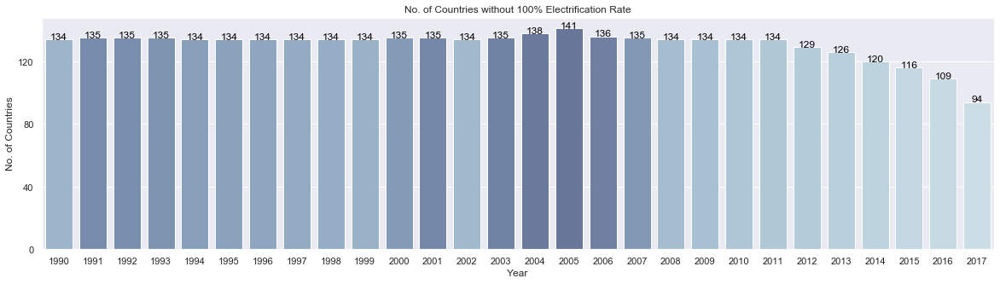

In [22]:
#For the ease of graph plotting, we generate table to show the yearly changes.
YearList=list(AccessToElecFill1.columns)[4:] #Year 1990-2017
NoOfCountry=[]
for i in YearList:
    NoOfCountry.append(sum(AccessToElecFill1[i]<100))
Table = pd.DataFrame(YearList)
Table.columns = ['Year']
Table['rate']=NoOfCountry
#Visualize the table. 
sns.set(style="whitegrid")
sns.set(rc={'figure.figsize':(20,5)})
#The fewer the number of countries is, the lighter the color of the bar is.
pal = sns.color_palette("ch:0.1,-.2,dark=.45", len(Table['rate']))
rank = Table["rate"].argsort().argsort() 
Bar_countryno = sns.barplot(x="Year", y="rate", data=Table, palette=np.array(pal[:])[rank])
# Add a legend and informative label.
for index, row in Table.iterrows():
    Bar_countryno.text(row.name,row.rate,round(row.rate,0), color='black', ha="center")
Bar_countryno.yaxis.set_major_locator(ticker.MultipleLocator(40))
Bar_countryno.set(ylabel="No. of Countries")   
Bar_countryno.set_title('No. of Countries without 100% Electrification Rate')
plt.show()

The number of countries with less than 100% electrification rate is decreasing sharply in recent years.

# Step 5. Prepare A Consolidated DataFrame before Continuing the Story
Since we are going to plot several graphs using similar variables, a consolidated DataFrame is firstly prepared.

In [23]:
#Consolidated DataFrame

#Group Region into the original DataFrame
Region = dfCountry[['Country Code','Region']]
CountrywithRegion = AccessToElec.merge(Region, how='left', on = 'Country Code')
CountryOnly = CountrywithRegion.drop(columns=['Indicator Name','Indicator Code'])
CountryOnly = CountryOnly.melt(id_vars =['Country Name','Country Code','Region']) 
CountryOnly = CountryOnly.dropna()
#Group East Asia & Pacific and South Asia together, to fit the size of graphs 
CountryOnly = CountryOnly.replace({'Region': {'East Asia & Pacific':'East, South Asia & Pacific','South Asia':'East, South Asia & Pacific'}})

#Build up the Population DataFrame
Population1 = Population.drop(columns=['Indicator Name','Indicator Code'])
Population2 = Population1.fillna(0)
Population_melt=Population2.melt(id_vars =['Country Name','Country Code']) 
Population_melt.rename(columns={'variable':'Year','value':'Population'}, inplace=True)

#Group Population DataFrame into the original DataFrame
CountryOnly = pd.concat([CountryOnly, Population_melt.reindex(CountryOnly.index)], axis=1)
CountryOnly.columns = ['Country Name','Country Code', 'Region', 'Year', 'Electrification Rate','drop 1', 'drop 2', 'drop 3','Population']
CountryOnly = CountryOnly.drop(columns=['drop 1','drop 2','drop 3'])
CountryOnly.loc[:,'Access Deficit'] = (100 - CountryOnly.loc[:,'Electrification Rate']) * CountryOnly.loc[:,'Population'] /100
CountryOnly = CountryOnly[CountryOnly['Country Code'].isin(WithCurrency)]

#Set the unit
CountryOnly.loc[:,'Electrification Rate'] = CountryOnly.loc[:,'Electrification Rate']/100
CountryOnly.loc[:,'Population'] = CountryOnly.loc[:,'Population']/1000
CountryOnly.loc[:,'Access Deficit'] = CountryOnly.loc[:,'Access Deficit']/1000
CountryOnly.columns = ['Country Name','Country Code', 'Region', 'Year', 'Electrification Rate','Population (k)','Access Deficit (k)']

#Build up the GDP per capita DataFrame
GDPperCapita1 = GDPperCapita.drop(columns=['Indicator Name','Indicator Code'])
GDPperCapita_melt=GDPperCapita1.melt(id_vars =['Country Name','Country Code']) 
GDPperCapita_melt.rename(columns={'variable':'Year','value':'GDP per capita'}, inplace=True)

#Merge GDP per capita DataFrame into the original DataFrame
CountryOnly = pd.concat([CountryOnly, GDPperCapita_melt.reindex(CountryOnly.index)], axis=1)
CountryOnly.columns = ['Country Name','Country Code', 'Region', 'Year', 'Electrification Rate','Population (k)','Access Deficit (k)', 'drop 1', 'drop 2', 'drop 3','GDP per capita']
CountryOnly = CountryOnly.drop(columns=['drop 1','drop 2','drop 3'])


(CountryOnly.pipe(PrettyPandas)
 .as_currency('', subset='Population (k)')
 .as_currency('', subset='Access Deficit (k)')
 .as_percent(subset='Electrification Rate')
 .as_currency('USD', subset='GDP per capita')
)


,Country Name,Country Code,Region,Year,Electrification Rate,Population (k),Access Deficit (k),GDP per capita
48,Albania,ALB,Europe & Central Asia,1990,100.00%,"3,286.54",0.00,$617.23
51,Andorra,AND,Europe & Central Asia,1990,100.00%,54.51,0.00,"$18,878.51"
56,Aruba,ABW,Latin America & Caribbean,1990,100.00%,62.15,0.00,"$12,307.31"
57,Australia,AUS,"East, South Asia & Pacific",1990,100.00%,"17,065.10",0.00,"$18,211.14"
58,Austria,AUT,Europe & Central Asia,1990,100.00%,"7,677.85",0.00,"$21,680.99"
60,"Bahamas, The",BHS,Latin America & Caribbean,1990,100.00%,256.22,0.00,"$12,356.42"
64,Belarus,BLR,Europe & Central Asia,1990,100.00%,"10,189.00",0.00,"$2,124.84"
65,Belgium,BEL,Europe & Central Asia,1990,100.00%,"9,967.38",0.00,"$20,710.64"
68,Bermuda,BMU,North America,1990,100.00%,59.33,0.00,"$26,841.52"
70,Bolivia,BOL,Latin America & Caribbean,1990,57.21%,"6,864.84","2,937.67",$709.06


# Step 6. Visualize Data (by Map)
# I. Electrification Rate (1990-2017)
Let's view the movement of electrication rates between different years.

In [24]:
#Let's plot the graph.
px.choropleth(CountryOnly, locations="Country Code",color='Electrification Rate',hover_name="Country Name",animation_frame="Year",range_color=[0,1],color_continuous_scale=px.colors.sequential.YlGnBu, projection='natural earth')

# II. Access Deficit (Country Based)
Electrification rate is a good indicator to show the status, but it does not contain the information of population. Let's see how many people are lived without electricity by countries in the map.

In [25]:
px.choropleth(CountryOnly, locations="Country Code",color='Access Deficit (k)',hover_name="Country Name",animation_frame="Year",range_color=[0,100000],color_continuous_scale=px.colors.sequential.YlGn, projection='natural earth')

# Step 7. Visualize Data (Electrification Rate vs. Economic Development)
Electrification rate is always linked to the economic development of countries. Let's figure out the relationship.  
# I. Electrification Rate vs. GDP per capita (Country Based)

In [26]:
px.scatter(CountryOnly, x="GDP per capita", y="Electrification Rate", animation_frame="Year", animation_group="Country Name", hover_name="Country Name", log_x=False, range_x=[0,max(CountryOnly['GDP per capita'])], range_y=[0,1])

The chart is not easy to read becasue of the extremely wide range of GDP per capita. Thus, from now on, we use logarithmic scales in the graph (as follows). 

In [27]:
px.scatter(CountryOnly, x="GDP per capita", y="Electrification Rate", animation_frame="Year", animation_group="Country Name", hover_name="Country Name", log_x=True, range_x=[1,max(CountryOnly['GDP per capita'])], range_y=[0,1])


We can see that the countries with fewer GDP per capita tend to have lower electrification rates. Currently the size of each dot is same. We add the population to reflect the size of each dot.

In [28]:
px.scatter(CountryOnly, x="GDP per capita", y="Electrification Rate", animation_frame="Year", animation_group="Country Name", size="Population (k)",hover_name="Country Name",  size_max=60, log_x=True, range_x=[1,max(CountryOnly['GDP per capita'])], range_y=[0,1])

# II. Electrification Rate vs. GDP per capita (Region Based)
The graph above is good to see the relationship between electrification rate and GDP per capita (with population size), but it is not easy to figure out in which continent the countries without 100% electrification rate are located. Therefore we use different colors to represent different regions.

In [29]:
px.scatter(CountryOnly, x="GDP per capita", y="Electrification Rate", animation_frame="Year", color="Region" ,animation_group="Country Name", size="Population (k)",hover_name="Country Name",  size_max=60,log_x=True, range_x=[1,max(CountryOnly['GDP per capita'])], range_y=[0,1])

The graph above puts all regions in a graph. We try to separate the regions into different "blocks", so it may provide a clear picture for users to see the results by regions.

In [43]:
Elec_Region2 = px.scatter(CountryOnly, x="GDP per capita", y="Electrification Rate", animation_frame="Year", color="Region" ,animation_group="Country Name", size="Population (k)",hover_name="Country Name",facet_col ="Region", width=1120,  size_max=60, log_x=True, range_y=[0,1])
Elec_Region2.layout.update(showlegend=False)
Elec_Region2.update_xaxes(automargin=True)
Elec_Region2.update_yaxes(automargin=True)
for name in Elec_Region2.layout.annotations:
    name.text = name.text.split("=")[1]
Elec_Region2.show()

We can simply see that most countries in the Sub-Saharan Africa do not have 100% electrification rate.

# Step 8. Perform Macro-analysis and Forecast
The previous step show the results by country level, let's move to global level for further analysis.
<br>Similar to Step 5, let's prepare a consolidated DataFrame first.

In [31]:
#Consolidated DataFrame

#Build up Electrification Rate DataFrame
World = AccessToElec.drop(columns=['Indicator Name','Indicator Code'])
World_melt = World.melt(id_vars =['Country Name','Country Code']) 
World = World_melt.dropna()
World.rename(columns={'variable':'Year','value':'Electrification Rate'}, inplace=True)

#Group Population DataFrame into the original DataFrame
World = pd.concat([World, Population_melt.reindex(World.index)], axis=1)
World.columns = ['Country Name','drop 1', 'Year', 'Electrification Rate','drop 2', 'drop 3', 'drop 4','Population']
World = World.drop(columns=['drop 1','drop 2','drop 3','drop 4'])
World.loc[:,'Access Deficit'] = (100 - World.loc[:,'Electrification Rate']) * World.loc[:,'Population'] /100

#Select World records
is_world = World['Country Name']== 'World'
World = World[is_world]
World = World.drop(columns=['Country Name'])

#Set the unit
World.loc[:,'Electrification Rate'] = World.loc[:,'Electrification Rate']/100
World.loc[:,'Population'] = World.loc[:,'Population']/1000000
World.loc[:,'Access Deficit'] = World.loc[:,'Access Deficit']/1000000
World.columns = ['Year', 'Electrification Rate','Population (M)','Access Deficit (M)']
World['Year'] = World['Year'].astype(str).astype(int)

(World.pipe(PrettyPandas)
 .as_currency('', subset='Population (M)')
 .as_currency('', subset='Access Deficit (M)')
 .as_percent(subset='Electrification Rate')
)

C:\Users\Anne\Anaconda3\lib\site-packages\pandas\core\frame.py:4025: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



,Year,Electrification Rate,Population (M),Access Deficit (M)
838,1993,76.66%,"5,538.45","1,292.85"
1102,1994,76.88%,"5,622.58","1,299.74"
1366,1995,77.66%,"5,707.53","1,274.92"
1630,1996,77.78%,"5,790.45","1,286.46"
1894,1997,78.24%,"5,873.07","1,278.11"
2158,1998,78.41%,"5,954.81","1,285.93"
2422,1999,79.47%,"6,035.28","1,239.08"
2686,2000,78.44%,"6,115.11","1,318.69"
2950,2001,78.02%,"6,194.46","1,361.37"
3214,2002,79.28%,"6,273.53","1,300.17"


Please note that unlike the time range of the electrification rate by country level, the available global electrification rates are from 1993 to 2017, so we will continue the story with the data  of 1993 to 2017.
# I. Access Deficit (Global)
With the consolidated DataFrame, let's establish a bar chart showing the number of people with and without electricity access in the world (for the years with records).

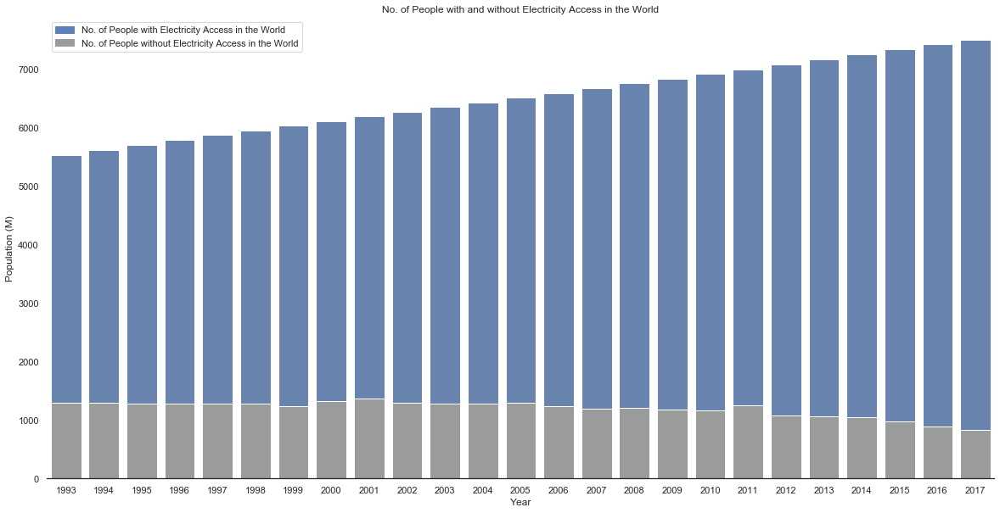

In [32]:
sns.set_style("white")
sns.set_context({"figure.figsize": (20, 10)})

#Plot 1 - background - "total" (top) series
top_plot = sns.barplot(x = World['Year'], y = World['Population (M)'], color = "#5C80BA").set_title('No. of People with and without Electricity Access in the World')
#Plot 2 - overlay - "bottom" series
bottom_plot = sns.barplot(x = World['Year'], y = World['Access Deficit (M)'], color = "#9A9B9B")

#Make plot look nicer
sns.despine(left=True)
bottom_plot.set_ylabel("Population (M)")
top_plot = mpatches.Patch(label ='No. of People with Electricity Access in the World', color = "#5C80BA")
bottom_plot = mpatches.Patch(label='No. of People without Electricity Access in the World', color = "#9A9B9B")
AccessDeficit = plt.legend(handles=[top_plot,bottom_plot])
plt.show()


Due to the significant improvement of global elecfication rate in the past decades, the access deficit is gradually decreasing even if the world population is growing. 
# II. When will the world reach universal electricity access?
The United Nations set Sustainable Development Goals with targets to transform the world to achieve a better and more sustainable future. One of the targets is "By 2030, ensure universal access to affordable, reliable and modern energy services". Is it possible to achieve the target, based on the existing improving process? 
<br>Now we are going to use three different models to forecast.
<br>
<br>Method 1. Ordinary Least Squares (OLS) Regression Model

Predicted Years: [2018 2019 2020 2021 2022 2023 2024 2025 2026 2027 2028 2029 2030 2031
 2032 2033 2034 2035 2036 2037 2038 2039 2040 2041 2042 2043 2044 2045
 2046]
Predicted Global Electrification Rates: [0.87381502 0.87845275 0.88309048 0.88772821 0.89236594 0.89700367
 0.9016414  0.90627913 0.91091686 0.91555459 0.92019232 0.92483005
 0.92946778 0.93410551 0.93874324 0.94338097 0.9480187  0.95265643
 0.95729416 0.96193189 0.96656963 0.97120736 0.97584509 0.98048282
 0.98512055 0.98975828 0.99439601 0.99903374 1.00367147]


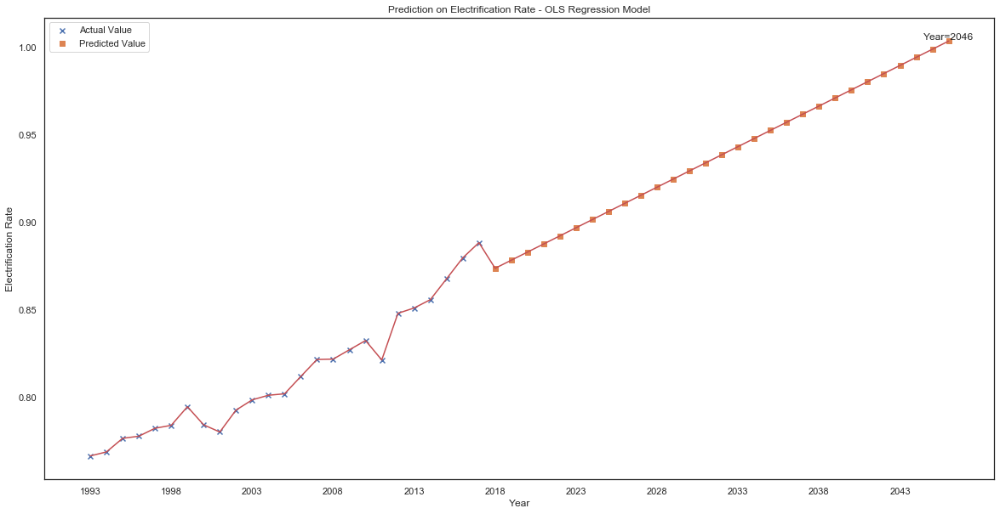

In [33]:
#Apply Linear Regression using Statsmodels
X = World[['Year']] 
Y = World[['Electrification Rate']]
X = sm.add_constant(X.to_numpy()) #add a constant
model = sm.OLS(Y, X).fit()
predictions = model.predict(X) 
print_model = model.summary()

#Make prediction
x1 = World.loc[:,'Year']
x_11 = x1.to_numpy()
x1n = np.arange(max(World['Year'])+1,max(World['Year'])+1+29)
xnew = sm.add_constant(x1n)
ynewpred = model.predict(xnew) 
y1 = World.loc[:,'Electrification Rate']
y_11 = y1.to_numpy()
print('Predicted Years:', x1n)
print('Predicted Global Electrification Rates:', ynewpred)
x = np.concatenate ((x_11,x1n))
y = np.concatenate ((y_11,ynewpred))
fig, ax = plt.subplots()
ax.plot(x, y, 'r')
ax.set_title('Prediction on Electrification Rate - OLS Regression Model')
ax.set_xlabel('Year')
ax.set_ylabel('Electrification Rate')
plt.xticks(np.arange(min(x), max(x)+1, 5))
scatter_OLMA = plt.scatter(x_11, y_11, marker='x')
scatter_OLMF = plt.scatter(x1n, ynewpred, marker=',')
plt.legend([scatter_OLMA, scatter_OLMF], ["Actual Value", "Predicted Value"])
label_OLS="Year={}".format(max(x1n))
texts_OLS = [plt.text(x[-1], y[-1], label_OLS,ha='center', va='bottom')]
plt.show()

The forecast result shows that the world achieve universal electricity access in 2046.
<br>
<br> Method 2. Gray Forecast Model

Predicted Years: [2018 2019 2020 2021 2022 2023 2024 2025 2026 2027 2028 2029 2030 2031
 2032 2033 2034 2035 2036 2037 2038 2039 2040 2041 2042 2043 2044 2045]
Predicted Global Electrification Rates: [0.87444685 0.87890846 0.88339284 0.8879001  0.89243036 0.89698373
 0.90156033 0.90616029 0.91078371 0.91543072 0.92010145 0.924796
 0.92951451 0.93425709 0.93902387 0.94381497 0.94863052 0.95347063
 0.95833545 0.96322508 0.96813966 0.97307932 0.97804417 0.98303437
 0.98805002 0.99309126 0.99815823 1.00325104]


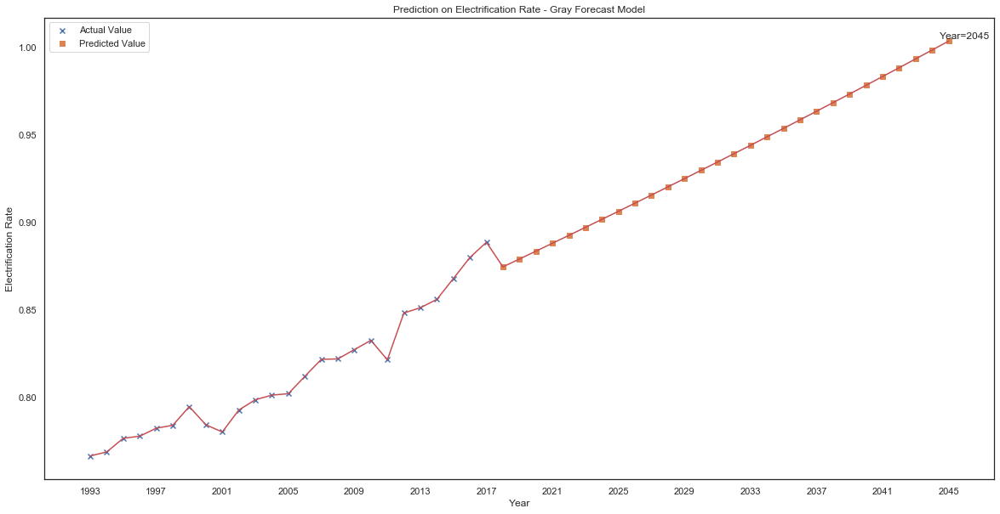

In [34]:
def GM11(x,n):
    x1 = x.cumsum()   
    z1 = (x1[:len(x1) - 1] + x1[1:])/2.0 
    z1 = z1.reshape((len(z1),1))  
    B = np.append(-z1,np.ones_like(z1),axis=1)  
    Y = x[1:].reshape((len(x) - 1,1))
    [[a],[b]] = np.dot(np.dot(np.linalg.inv(np.dot(B.T, B)), B.T), Y)
    result = (x[0]-b/a)*np.exp(-a*(n-1))-(x[0]-b/a)*np.exp(-a*(n-2))  
    S1_2 = x.var()
    e = list()
    for index in range(1,x.shape[0]+1):
        predict = (x[0]-b/a)*np.exp(-a*(index-1))-(x[0]-b/a)*np.exp(-a*(index-2))
        e.append(x[index-1]-predict)
    S2_2 = np.array(e).var()
    predict = list()
    for index in range(x.shape[0]+1,x.shape[0]+n+1):
        predict.append((x[0]-b/a)*np.exp(-a*(index-1))-(x[0]-b/a)*np.exp(-a*(index-2)))
    predict = np.array(predict)
    return {
            'a':{'value':a},
            'b':{'value':b},
            'predict':{'value':result},
            'predict':{'value':predict},
            }

if __name__ == "__main__":
    x1n_GM = np.arange(max(World['Year'])+1-5,max(World['Year'])+1-5+33)
    x_GM = y_11[0:22] #input data
    y_GM = y_11[20:] #data to be predicted
    result_GM = GM11(x_GM,33)
    predict_GM = result_GM['predict']['value']
    print('Predicted Years:',x1n_GM[5:])
    print('Predicted Global Electrification Rates:',predict_GM[5:])

x1_GM = np.concatenate ((x_11,x1n_GM[5:]))
y1_GM = np.concatenate ((y_11,predict_GM[5:]))
    
fig_GM, ax_GM = plt.subplots()
ax_GM.plot(x1_GM, y1_GM, 'r')
ax_GM.set_title('Prediction on Electrification Rate - Gray Forecast Model')
ax_GM.set_xlabel('Year')
ax_GM.set_ylabel('Electrification Rate')
plt.xticks(np.arange(min(x1_GM), max(x1_GM)+1, 4))
scatter_GMA = plt.scatter(x_11, y_11, marker='x')
scatter_GMF = plt.scatter(x1n_GM[5:], predict_GM[5:], marker=',')
plt.legend([scatter_GMA, scatter_GMF], ["Actual Value", "Predicted Value"])
label_GM="Year={}".format(max(x1_GM))
texts_GM = [plt.text(x[-1], y[-1], label_GM,ha='center', va='bottom')]
plt.show()

The forecast result shows that the world will achieve universal electricity access in 2045.
<br>
<br> Method 3. L1 Regularization: Lasso Regression Model

Predicted Years: [[2018 2019 2020 2021 2022 2023 2024 2025 2026 2027 2028 2029 2030 2031
  2032 2033 2034 2035 2036 2037 2038 2039 2040 2041 2042 2043 2044 2045
  2046 2047]]
Predicted Global Electrification Rates: [0.87131502 0.87576044 0.88020586 0.88465128 0.88909671 0.89354213
 0.89798755 0.90243297 0.9068784  0.91132382 0.91576924 0.92021467
 0.92466009 0.92910551 0.93355093 0.93799636 0.94244178 0.9468872
 0.95133263 0.95577805 0.96022347 0.96466889 0.96911432 0.97355974
 0.97800516 0.98245059 0.98689601 0.99134143 0.99578685 1.00023228]


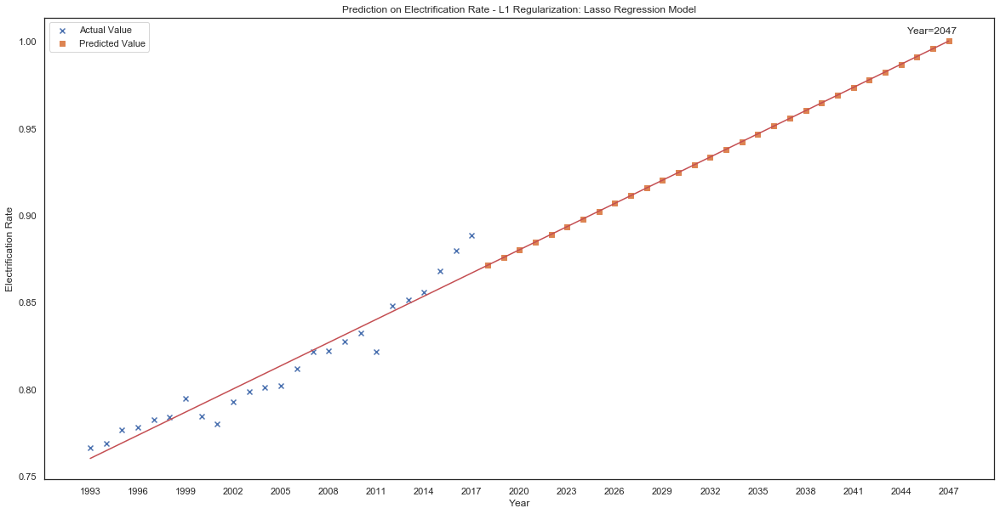

In [35]:
x_SK = x_11.reshape(-1, 1)    
model = Lasso(alpha=0.01)  #adjust the alpha to achieve fit degree 
model.fit(x_SK, y_11)   
arrayX=np.array(range(min(World['Year']),min(World['Year'])+1+54)).reshape(55,1)
predict_SK = model.predict(arrayX)
print('Predicted Years:', arrayX[25:].reshape(1, -1))
print('Predicted Global Electrification Rates:', predict_SK[25:])


fig_SK, ax_SK = plt.subplots()
ax_SK.plot(arrayX,predict_SK,"r")
ax_SK.set_title('Prediction on Electrification Rate - L1 Regularization: Lasso Regression Model')
ax_SK.set_xlabel('Year')
ax_SK.set_ylabel('Electrification Rate')
plt.xticks(np.arange(min(arrayX), max(arrayX)+1, 3))
scatter_SKA = plt.scatter(x_SK, y_11, marker='x')
scatter_SKF = plt.scatter(arrayX[25:], predict_SK[25:], marker=',')
plt.legend([scatter_SKA, scatter_SKF], ["Actual Value", "Predicted Value"])
label_SK="Year={}".format(np.asscalar(max(arrayX)))
texts_SK = [plt.text(x[-1], y[-1], label_SK,ha='center', va='bottom')]
plt.show()

The forecast result shows that the world will achieve universal electricity access in 2047.
<br>
<br> The above three models provide the similar results (i.e. universal electricity access may be reached in around 2045-2047). Since the results are similar, we think that they are quite reliable. Therefore, we infer that it is difficult to achieve universal electricity access by 2030, if the current improving progress is kept, and no rectified action is taken.

# Step 10. Export All Static Images (Optional)
The project comes to an end. This step is just for a reader's own interest, if he or she wishes to export the static images for his or her own use.

# I. Map of Electrification Rate
The map of electrification rate in Step 6 is an annotated map. Here we prepare a static map for users to export the status of a specific year.

In [36]:
InputYear = str(input("Enter a year: "))
if InputYear in YearList:
    ElecRate = go.Figure(data=go.Choropleth(locations=AccessToElec_adj['Country Name'],z = AccessToElec_adj[InputYear],locationmode = 'country names', colorscale = 'teal',colorbar_title = "%",))
    ElecRate.update_layout(title_text = 'Electrification Rate '+InputYear,geo_scope='world')
    FileName = "Electrification Rate {}.png".format(InputYear)
    pio.write_image(ElecRate, FileName)
    print('The image has been exported to your drive.')
else:
    print('Invalid input')

Enter a year: 2017
The image has been exported to your drive.


# II. All bar and line charts
All static graphs in the previous steps can be exported here.

In [37]:
figure1 = Bar_countryno.get_figure()
figure1.savefig('No. of Countries without 100% Electrification Rate.png')

figure2 = AccessDeficit.get_figure()
figure2.savefig('Access Deficit.png')

figure3 = ax.get_figure()
figure3.savefig('Forecast_OLM.png')

figure4 = ax_GM.get_figure()
figure4.savefig('Forecast_GM.png')

figure5 = ax_SK.get_figure()
figure5.savefig('Forecast_Lasso.png')

print('The image has been exported to your drive.')

The image has been exported to your drive.


That's all of the project. Thanks for reading.